In [3]:
import pandas as pd
from naive_bayes import NaiveBayes
from utils import tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary, getTrainingAndTestingData, plot_wordclouds_per_class
from modelUtils import run_model

In [4]:
df_train = pd.read_csv("train.csv")
print(f"df_train.shape : {df_train.shape}")

print(df_train.head())

df_test = pd.read_csv("test.csv")
print(f"df_test.shape : {df_test.shape}")

print(df_test.head())

results = {}

df_train.shape : (140000, 3)
   label                              title  \
0      3                          Ernie Cox   
1     10                          Holosteum   
2      9                Pestarella tyrrhena   
3      1          MidSun Junior High School   
4      6  St James' Church Wrightington Bar   

                                             content  
0   Ernest Ernie Cox (February 17 1894 – February...  
1   Holosteum is a genus of plants in the Pink fa...  
2   Pestarella tyrrhena (formerly Callianassa tyr...  
3   MidSun Junior High School is a Canadian middl...  
4   St James' Church Wrightington Bar is in Churc...  
df_test.shape : (35000, 3)
   label                          title  \
0      4                   Lajos Drahos   
1      5          USS Huntsville (1857)   
2      0                         SCAFCO   
3      6               McLean's Mansion   
4      5  Avioane Craiova IAR-93 Vultur   

                                             content  
0   Lajos Drahos 

In [3]:
# Question Part 1 :: Unigram without stemming and removing stop words
# Train the model with context only corresponding to the labels
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

# 1. unigram - without stem - without stop words - done
model = NaiveBayes() 
print("--------UNIGRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["UNIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, ernie, cox, (february, 17, 1894, –, f...            3
1  [holosteum, is, a, genus, of, plants, in, the,...           10
2  [pestarella, tyrrhena, (formerly, callianassa,...            9
3  [midsun, junior, high, school, is, a, canadian...            1
4  [st, james', church, wrightington, bar, is, in...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajos, drahos, (7, march, 1895, -, 2, june, 1...            4
1  [uss, huntsville, was, a, steamer, acquired, b...            5
2  [founded, in, 1954, by, ben, g., stone, scafco...            0
3  [mclean's, mansion, (originally, holly, lea), ...            6
4  [the, avioane, craiova, iar-93, vultur, (eagle...            5
--------UNIGRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 424380
Shape of phi_y: (14,)
Shape 

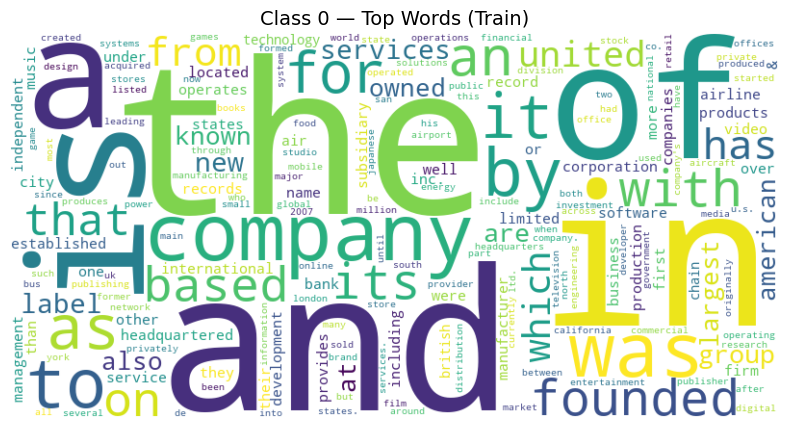

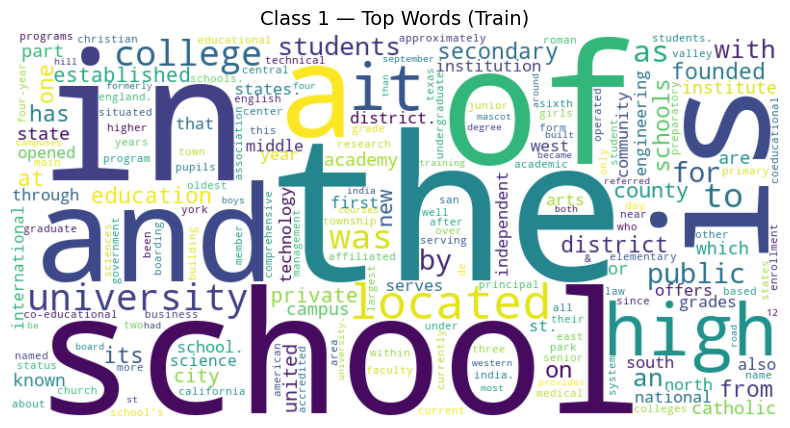

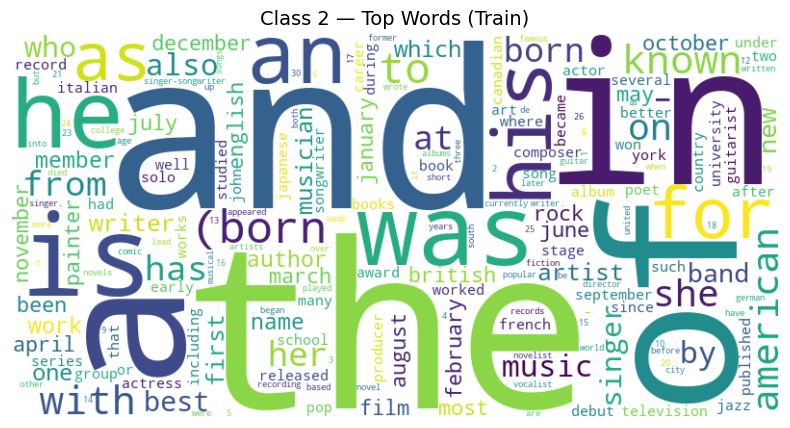

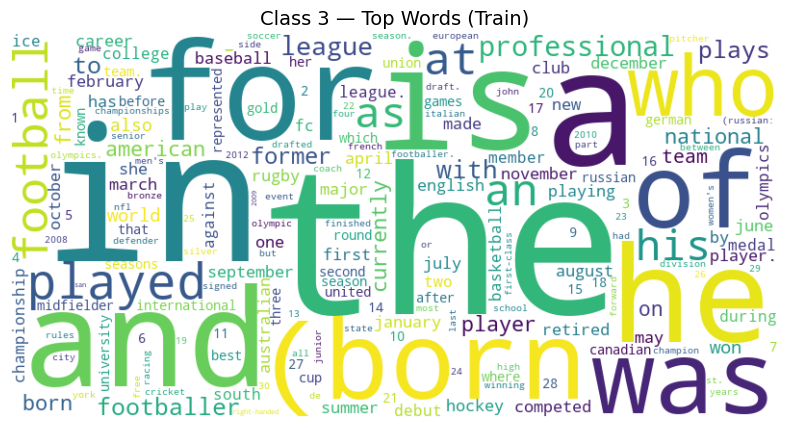

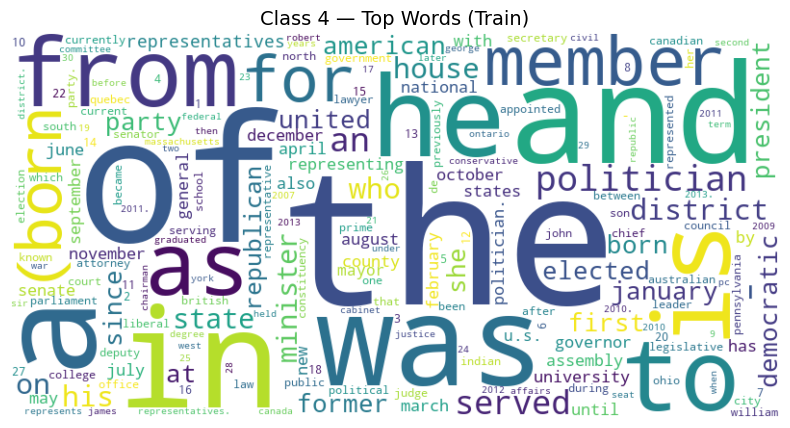

...

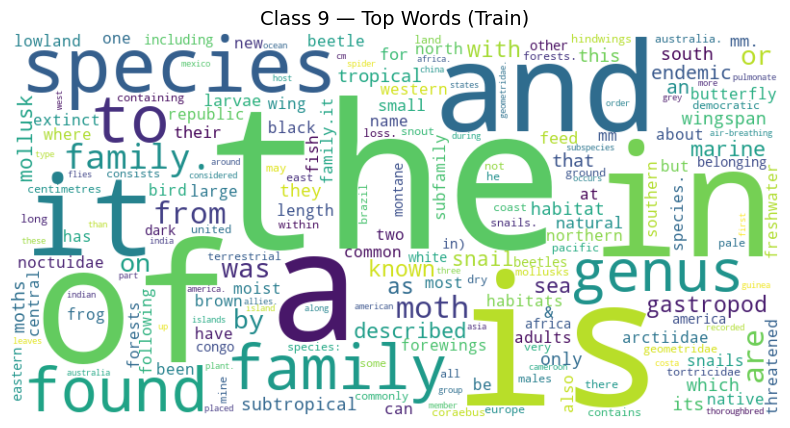

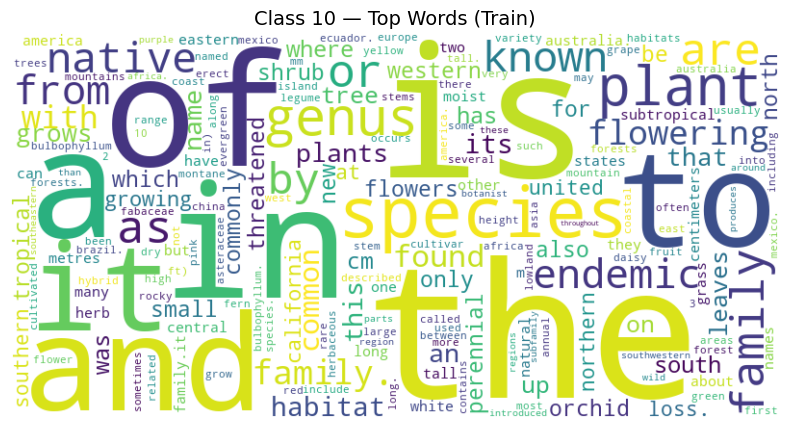

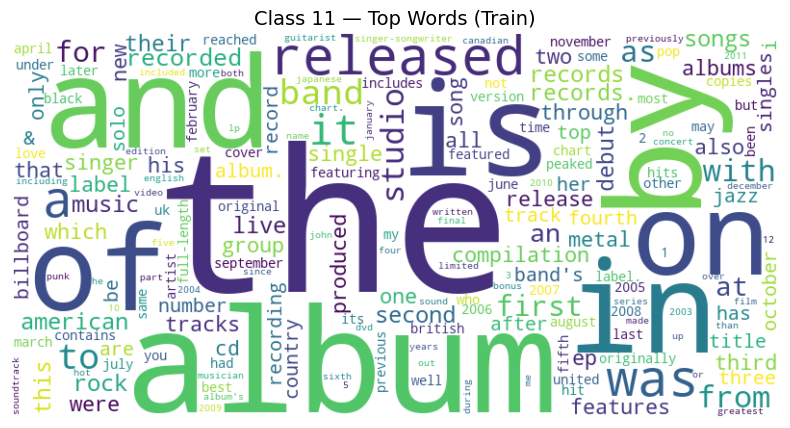

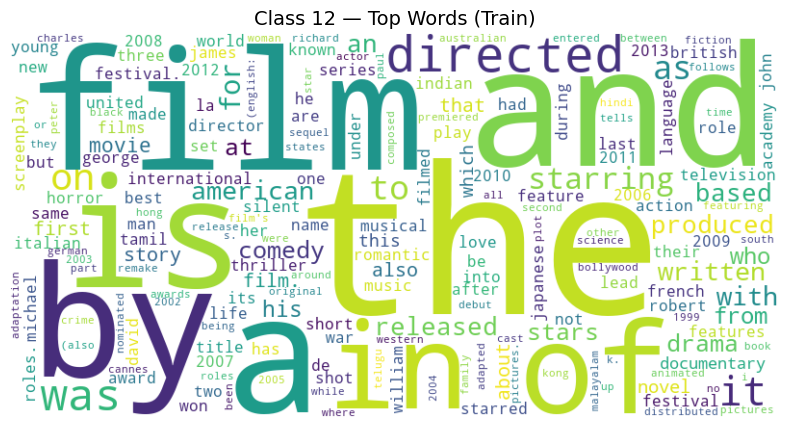

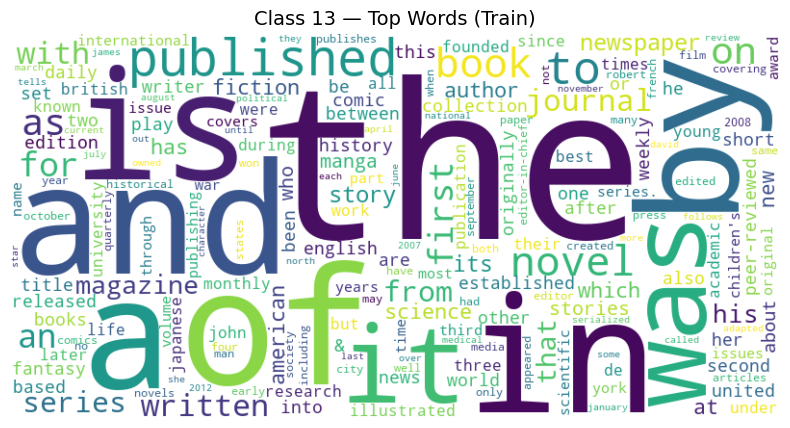

In [4]:
plot_wordclouds_per_class(trainingData, maxWords = 200, width = 800, height = 400)


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, erni, cox, februari, 17, 1894, –, feb...            3
1  [holosteum, genu, plant, pink, famili, caryoph...           10
2  [pestarella, tyrrhena, formerli, callianassa, ...            9
3  [midsun, junior, high, school, canadian, middl...            1
4  [st, james', church, wrightington, bar, church...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajo, draho, 7, march, 1895, -, 2, june, 1983...            4
1  [uss, huntsvil, steamer, acquir, union, navi, ...            5
2  [found, 1954, ben, g., stone, scafco, corpor, ...            0
3  [mclean', mansion, origin, holli, lea, homeste...            6
4  [avioan, craiova, iar-93, vultur, eagl, twin-e...            5


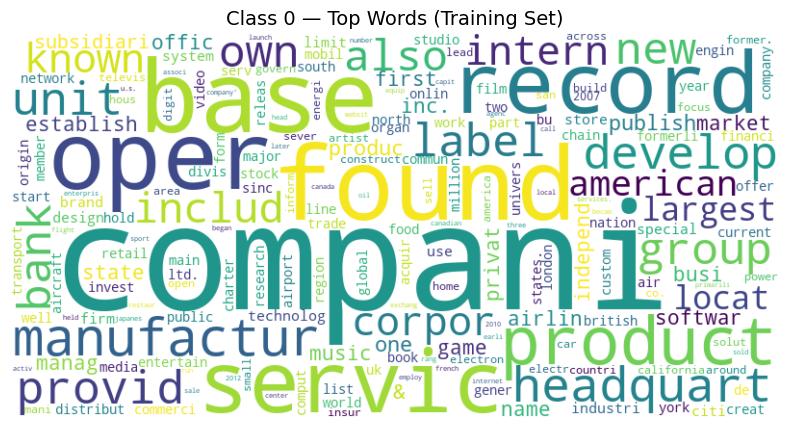

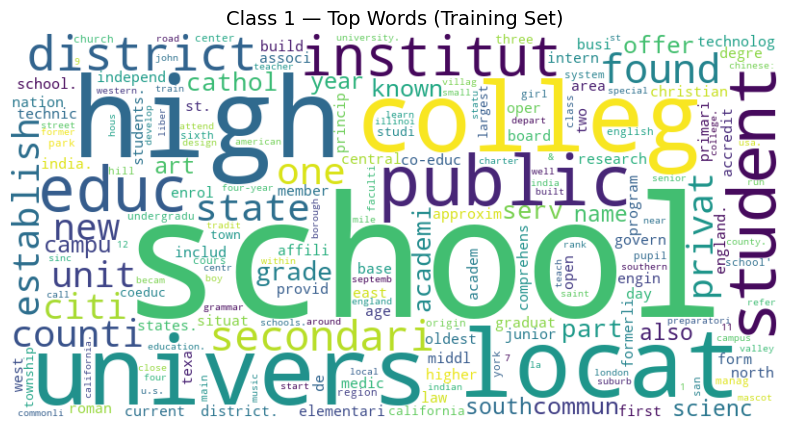

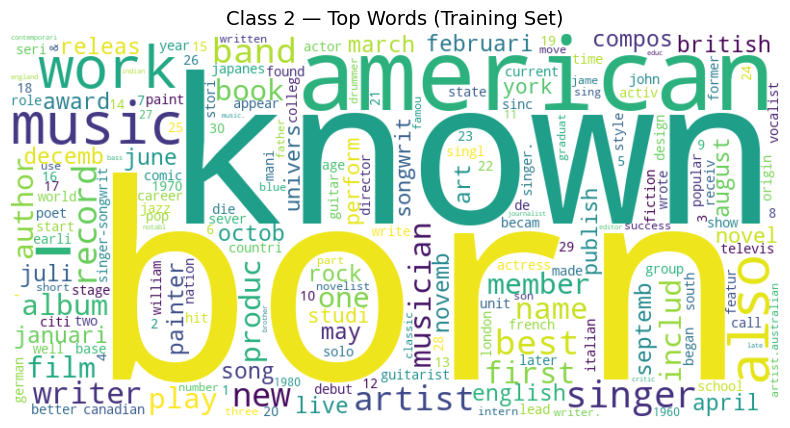

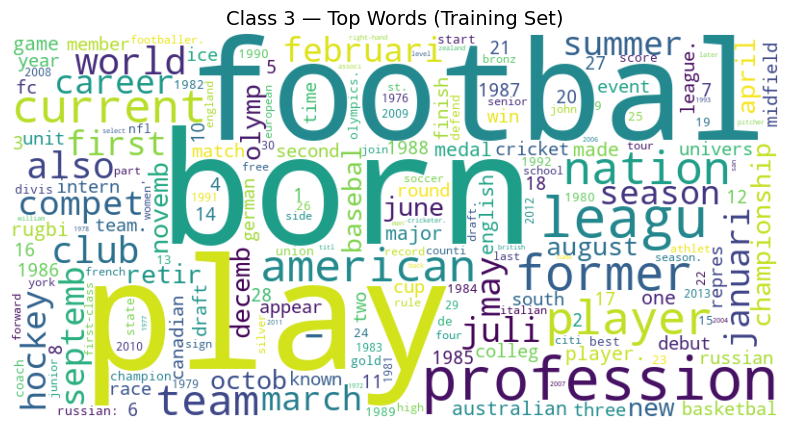

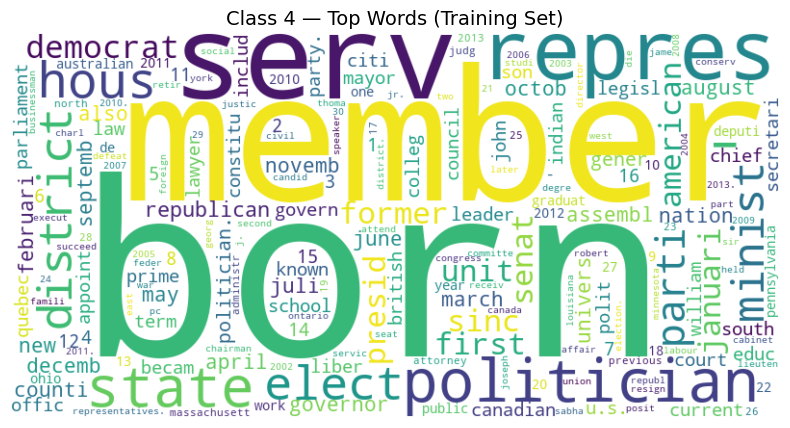

...

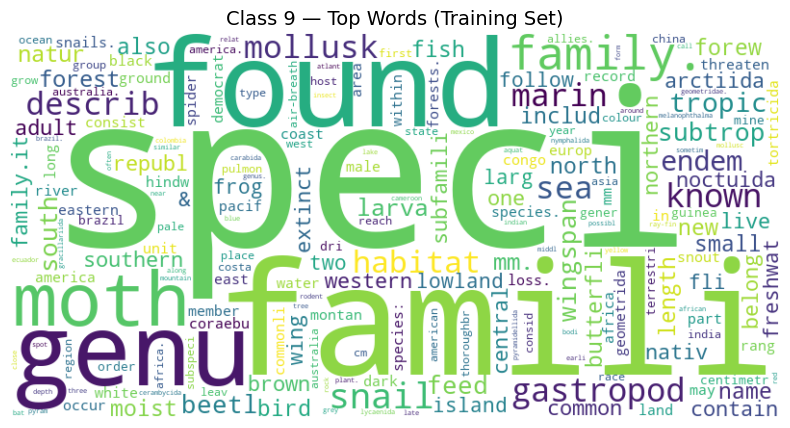

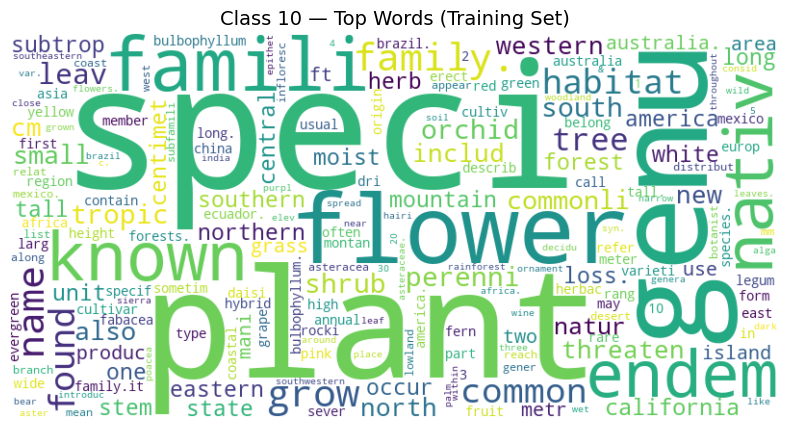

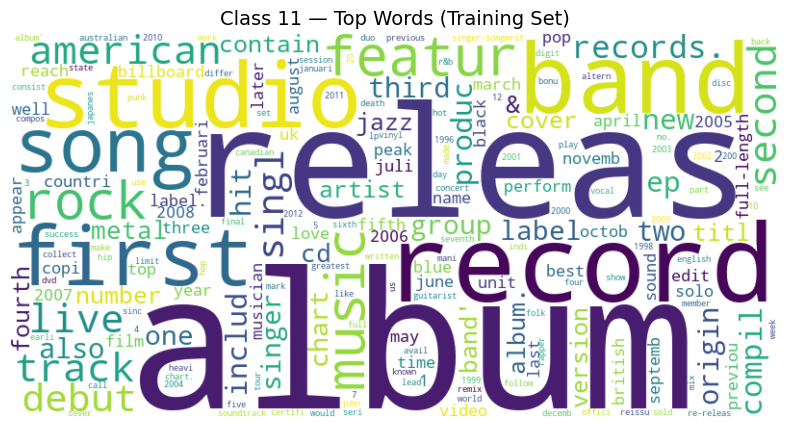

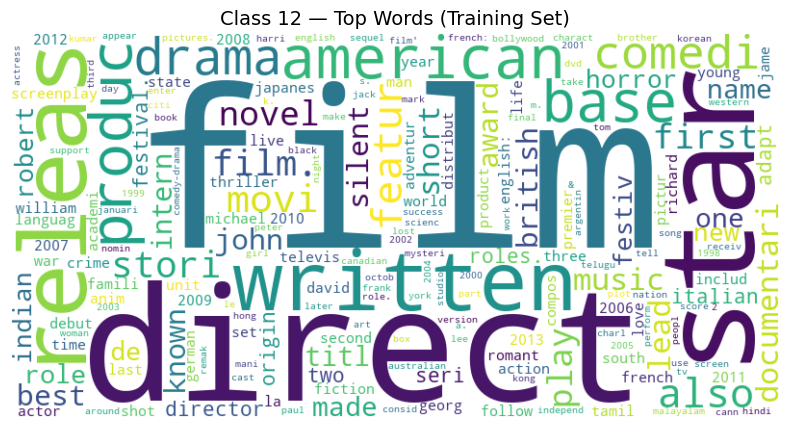

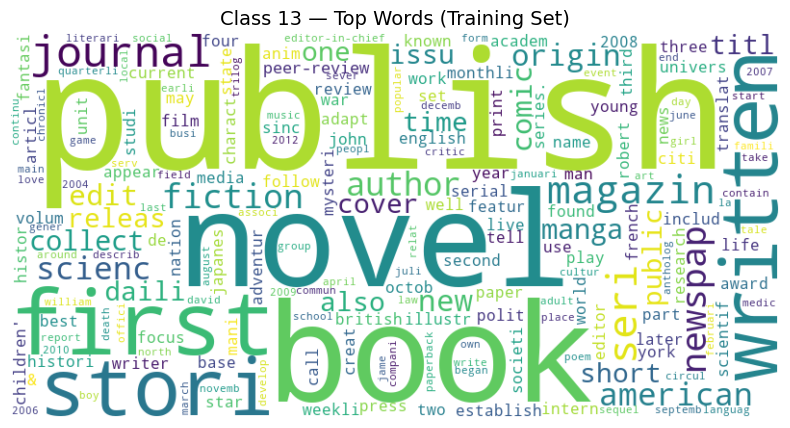

--------UNIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 374222
Shape of phi_y: (14,)
Shape of phi_j_given_y: (14, 374222)
Evaluating on train data...
Evaluating on 140000 examples
Overall Accuracy: 97.31%

Class 0 -> Precision: 0.9508, Recall: 0.9000, F1-Score: 0.9247
Class 1 -> Precision: 0.9680, Recall: 0.9859, F1-Score: 0.9769
Class 2 -> Precision: 0.9697, Recall: 0.9196, F1-Score: 0.9440
Class 3 -> Precision: 0.9832, Recall: 0.9949, F1-Score: 0.9890
Class 4 -> Precision: 0.9784, Recall: 0.9840, F1-Score: 0.9812
Class 5 -> Precision: 0.9790, Recall: 0.9913, F1-Score: 0.9851
Class 6 -> Precision: 0.9639, Recall: 0.9674, F1-Score: 0.9657
Class 7 -> Precision: 0.9835, Recall: 0.9923, F1-Score: 0.9879
Class 8 -> Precision: 0.9992, Recall: 0.9705, F1-Score: 0.9846
Class 9 -> Precision: 0.9984, Recall: 0.9803, F1-Score: 0.9893
Class 10 -> Precision: 0.9912, Recall: 0.9953, F1-Score: 0.9933
Class 11 -> Precision: 0.9453, Rec

In [5]:
# Question 1, part 2 :: Unigram with stemming and removing stop words

# # (a) Perform stemming and remove the stop-words in the training as well as the validation data.
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [1])

# (c) Learn a new model on the transformed data. Report the validation set accuracy
# 2. unigram - with stem - with stop words       - done
trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

# (b) Construct word clouds for both classes on the transformed data
plot_wordclouds_per_class(trainingData, data_type = "Training Set", maxWords = 200, width = 800, height = 400)

model = NaiveBayes()
print("--------UNIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------")
results["UNIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")

In [6]:
#(d) How does your accuracy change over the validation set? Comment on your observations.

In [7]:
# Question 3 :: Bigram with stemming and removing stop words
# 3. bigram - with stem - with stop words        -done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")
model = NaiveBayes()
print("--------BIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------")
results["BIGRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest erni, erni cox, cox (februari, (februa...            3
1  [holosteum genu, genu plant, plant pink, pink ...           10
2  [pestarella tyrrhena, tyrrhena (formerli, (for...            9
3  [midsun junior, junior high, high school, scho...            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajo draho, draho (7, (7 march, march 1895, 1...            4
1  [uss huntsvil, huntsvil steamer, steamer acqui...            5
2  [found 1954, 1954 ben, ben g., g. stone, stone...            0
3  [mclean' mansion, mansion (origin, (origin hol...            6
4  [avioan craiova, craiova iar-93, iar-93 vultur...            5
--------BIGRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 2180883
Shape of phi_y: (14,)
Shape of phi

In [8]:
# Question 3 :: Bigram without stemming or removing stop words
# bigram - without stem - without stop words  - done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------BIGRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["BIGRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0,  text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest ernie, ernie cox, cox (february, (febr...            3
1  [holosteum is, is a, a genus, genus of, of pla...           10
2  [pestarella tyrrhena, tyrrhena (formerly, (for...            9
3  [midsun junior, junior high, high school, scho...            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajos drahos, drahos (7, (7 march, march 1895...            4
1  [uss huntsville, huntsville was, was a, a stea...            5
2  [founded in, in 1954, 1954 by, by ben, ben g.,...            0
3  [mclean's mansion, mansion (originally, (origi...            6
4  [the avioane, avioane craiova, craiova iar-93,...            5
--------BIGRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 1980745
Shape of phi_y: (14,)
Shape 

In [9]:
# unigram - with stem - without stop words
# Question 4 :: uigram with stemming and removing stop words
# 4. uigram - with stem - with stop words        -done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = True, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = True, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------UNIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["UNIGRAM-WITH STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, erni, cox, (februari, 17, 1894, –, fe...            3
1  [holosteum, is, a, genu, of, plant, in, the, p...           10
2  [pestarella, tyrrhena, (formerli, callianassa,...            9
3  [midsun, junior, high, school, is, a, canadian...            1
4  [st, james', church, wrightington, bar, is, in...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajo, draho, (7, march, 1895, -, 2, june, 198...            4
1  [uss, huntsvil, wa, a, steamer, acquir, by, th...            5
2  [found, in, 1954, by, ben, g., stone, scafco, ...            0
3  [mclean', mansion, (origin, holli, lea), is, a...            6
4  [the, avioan, craiova, iar-93, vultur, (eagle)...            5
--------UNIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 399088
Shape of phi_y: (14,)
Shape of 

In [10]:
# 4. unigram - without stem - with stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = False, window = [1])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = False, window = [1])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------UNIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------")
results["UNIGRAM-WITHOUT STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, ernie, cox, (february, 17, 1894, –, f...            3
1  [holosteum, genus, plants, pink, family, (cary...           10
2  [pestarella, tyrrhena, (formerly, callianassa,...            9
3  [midsun, junior, high, school, canadian, middl...            1
4  [st, james', church, wrightington, bar, church...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajos, drahos, (7, march, 1895, -, 2, june, 1...            4
1  [uss, huntsville, steamer, acquired, union, na...            5
2  [founded, 1954, ben, g., stone, scafco, corpor...            0
3  [mclean's, mansion, (originally, holly, lea), ...            6
4  [avioane, craiova, iar-93, vultur, (eagle), tw...            5
--------UNIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 424207
Shape of phi_y: (14,)
Shape of 

In [11]:
# 4. bigram - with stem - without stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = True, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = True, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------BIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["BIGRAM-WITH STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest erni, erni cox, cox (februari, (februa...            3
1  [holosteum is, is a, a genu, genu of, of plant...           10
2  [pestarella tyrrhena, tyrrhena (formerli, (for...            9
3  [midsun junior, junior high, high school, scho...            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajo draho, draho (7, (7 march, march 1895, 1...            4
1  [uss huntsvil, huntsvil wa, wa a, a steamer, s...            5
2  [found in, in 1954, 1954 by, by ben, ben g., g...            0
3  [mclean' mansion, mansion (origin, (origin hol...            6
4  [the avioan, avioan craiova, craiova iar-93, i...            5
--------BIGRAM -- WITH STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 1879097
Shape of phi_y: (14,)
Shape of 

In [12]:
# 4. bigram - without stem - with stop words
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = False, window = [2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = False, window = [2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------BIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------")
results["BIGRAM-WITHOUT STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0, text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest ernie, ernie cox, cox (february, (febr...            3
1  [holosteum genus, genus plants, plants pink, p...           10
2  [pestarella tyrrhena, tyrrhena (formerly, (for...            9
3  [midsun junior, junior high, high school, scho...            1
4  [st james', james' church, church wrightington...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajos drahos, drahos (7, (7 march, march 1895...            4
1  [uss huntsville, huntsville steamer, steamer a...            5
2  [founded 1954, 1954 ben, ben g., g. stone, sto...            0
3  [mclean's mansion, mansion (originally, (origi...            6
4  [avioane craiova, craiova iar-93, iar-93 vultu...            5
--------BIGRAM -- WITHOUT STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 2288827
Shape of phi_y: (14,)
Shape of 

In [13]:
# Question 3 :: Uni+Bigram without stemming or removing stop words
# bigram - without stem - without stop words  - done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [1,2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = False, with_stemming = False, window = [1,2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------Uni+Bi-GRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------")
results["Uni+BI-GRAM-WITHOUT STEMMING-WITHOUT STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0,  text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, ernie, cox, (february, 17, 1894, –, f...            3
1  [holosteum, is, a, genus, of, plants, in, the,...           10
2  [pestarella, tyrrhena, (formerly, callianassa,...            9
3  [midsun, junior, high, school, is, a, canadian...            1
4  [st, james', church, wrightington, bar, is, in...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajos, drahos, (7, march, 1895, -, 2, june, 1...            4
1  [uss, huntsville, was, a, steamer, acquired, b...            5
2  [founded, in, 1954, by, ben, g., stone, scafco...            0
3  [mclean's, mansion, (originally, holly, lea), ...            6
4  [the, avioane, craiova, iar-93, vultur, (eagle...            5
--------Uni+Bi-GRAM -- WITHOUT STEMMING -- WITHOUT STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 2405125
Shape of phi_y: (14,)
S

In [14]:
# Question 3 :: Uni+Bigram with stemming and removing stop words
# bigram - with stem - with stop words  - done
df_train, vocabulary = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_train, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [1,2])
df_test, _ = tokenizeAndRemoveStopWordsOrStemAndReturnVocabulary(df_test, "content", target_col = "Tokenized Description", remove_stop_words = True, with_stemming = True, window = [1,2])

trainingData, testingData = getTrainingAndTestingData(df_train, df_test, target_field = "Tokenized Description")

model = NaiveBayes()
print("--------Uni+Bi-GRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------")
results["Uni+BI-GRAM-WITH STEMMING-WITH STOP WORDS REMOVAL"] = run_model(model, vocabulary, trainingData, testingData, smoothening = 1.0,  text_col = "Tokenized Description")


Training Data Sample:
                               Tokenized Description  Class Index
0  [ernest, erni, cox, (februari, 17, 1894, –, fe...            3
1  [holosteum, genu, plant, pink, famili, (caryop...           10
2  [pestarella, tyrrhena, (formerli, callianassa,...            9
3  [midsun, junior, high, school, canadian, middl...            1
4  [st, james', church, wrightington, bar, church...            6

Testing Data Sample:
                               Tokenized Description  Class Index
0  [lajo, draho, (7, march, 1895, -, 2, june, 198...            4
1  [uss, huntsvil, steamer, acquir, union, navi, ...            5
2  [found, 1954, ben, g., stone, scafco, corpor, ...            0
3  [mclean', mansion, (origin, holli, lea), homes...            6
4  [avioan, craiova, iar-93, vultur, (eagle), twi...            5
--------Uni+Bi-GRAM -- WITH STEMMING -- WITH STOP WORDS REMOVAL---------
Number of classes: 14, examples: 140000, vocab size: 2579866
Shape of phi_y: (14,)
Shape o